## Enhancing OCT image resolution with SRGANs


#### Keywords: unsupervised super-resolution, SRGAN-VGG19

## I. Introduction

Optical coherence tomography (OCT) scans of the retina are used to produce high resolution cross-sectional images of the retina. OCT imaging is the now the standard of care in opthalmology
and there is interest in applying AI methods to enhance conventional OCT images from commercial systems. 

The computational enhancement of image resolution, is known as *super-resolution*. Generative Adversarial Networks (GANs) <a href="#ref1">[1]</a> are one of newer methods that have been applied to super resolution and in this notebook we use a  Super-Resolution GAN (SRGAN) <a href="#ref2">[2]</a> to enhance subsampled OCT scans.

The SRGAN, introduced in 2016, addressed the issue of reconstructing high resolution (HR) images from low resolution (LR) images such that fine texture detail in the reconstructed super resolution (SR) images was not lost. Here the authors used a perceptual loss instead of a pixel-wise Mean Squared Error (MSE) loss. MSE loss approaches give a high Peak Signal-to-Noise (PSNR) value, but they also tend to produce overly-smooth images with insufficient high-frequency details. The perceptual loss by contrast has a content loss component that computes pixel-wise differences in feature space (not pixel space) and this results in an SR image that is closer to the subjective evaluation of human observers.

The SRGAN model uses a deep neural network (built with residual blocks) and optimized using perceptual loss in a GAN framework. A VGG-19 network is used for feature extraction; this allows us to compute the feature distance between the original and generated images sent through the feature extractor.

In this exercise we use an SRGAN design which is faithful to the original SRGAN <a href="#ref2">[2]</a>. This architecture used a pre-trained VGG-19 feature extractor and gave photorealistic results on large (4x) upsampled low resolution images. It has been applied to the DIV2K, CelebA and other natural image datasets and here we want to see how it performs on OCT data. This network will serve as a baseline for further experiments with upscaling, choice of feature extractor etcetera.

The SRGAN is implemented as follows:

**Training**
1. We downsample HR OCT images by 4x to synthetically create LR training data. This gives us pairs of HR and LR images for the training data set.
2. The Generator upsamples LR images by 4x and will be trained to generate SR images.
3. The discriminator will be trained to distinguish between HR/SR images; the GAN loss is backpropagated to the discriminator and the generator.

**Evaluation**  
The  visual quality of generated images will be observed. In addition standard quantitative metrics, Peak Signal-to-Noise Ratio and Structural Similarity Index (PSNR, SSIM), will be used to assess the results.

**Code**  
The code is based on the SRGAN  paper <a href="#ref2">[2]</a> and Kailash Ahirwar's code <a href="#ref3">[3]</a>.

## II. Imports Library

In [1]:
import numpy as np
import pandas as pd
import glob
import os

import random
from numpy import asarray
from itertools import repeat
from tqdm import tqdm

import imageio
from imageio import imread
from PIL import Image
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Basic Torch for model construction

import torch
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision import models
from torchinfo import summary

from sklearn.model_selection import train_test_split
from torchvision.models import vgg19

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
# Pytorch Ignite for metric evaluation

from ignite.metrics import PSNR, SSIM

In [4]:
# Pytorch Lightning for fast prototyping

import lightning as l
from lightning.pytorch.trainer.trainer import Trainer
from lightning.pytorch.utilities.model_summary import ModelSummary

In [5]:
# data path
# 2 Dataset: Retinal OCT Images and Brain Tumor MRI Dataset
MRI_PATH = r'.\\data\\brain-mri'
OCT_PATH = r'.\\data\\oct'

EPOCHS = 100
BATCH_SIZE = 4

LR_SHAPE = (64, 64, 3)
HR_SHAPE = (256, 256, 3)

# use seed for reproducible results
SEED = np.random.randint(0, 1000)
torch.manual_seed(SEED)

## III. Data

Load data, process data, and create training, validation and test sets.

In [6]:
def get_train_images(data_path, sets = ""):
    # CLASSES = ['CNV', 'DME', 'DRUSEN', 'NORMAL'] # Switch to OCT dataset
    CLASSES = ['glioma', 'meningioma', 'notumor', 'pituitary']
    image_list = {"path": [], "class": []}
    
    for class_type in CLASSES:
        for file in glob.glob(data_path + f"\{sets}" + f'\{class_type}' + "\*"):
            image_list["path"].append(file)
            image_list["class"].append(class_type)
    
    return image_list

In [7]:
def find_img_dims(df):
    min_size = []
    max_size = []
    
    for i in range(len(df)):
        img = Image.open(df['path'][i])
        min_size.append(min(img.size))
        max_size.append(max(img.size))
        
    return min(min_size), max(max_size)

In [8]:
# Push all data into df
def create_df(image_list):
    data = []
    for i in range(len(image_list["path"])):
        data.append([image_list["path"][i], image_list["class"][i]])
        
    df = pd.DataFrame(data, columns = ['path', 'class'])
    return df

In [9]:
# get min/max image sizes
data_train = create_df(get_train_images(MRI_PATH, "train"))
data_test = create_df(get_train_images(MRI_PATH, "test"))
# data_val = create_df(get_train_images(OCT_PATH, "val")) # Brain-MRI dataset does not have validation set

In [10]:
min_size, max_size = find_img_dims(data_train)
print(f"Min image size: {min_size}, Max image size: {max_size}")

Min image size: 150, Max image size: 1920


In [11]:
low_trans = transforms.Compose([
    transforms.Resize((LR_SHAPE[0], LR_SHAPE[1])),
    transforms.ToTensor(),
    # transforms.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]),
])

high_trans = transforms.Compose([
    transforms.Resize((HR_SHAPE[0], HR_SHAPE[1])),
    transforms.ToTensor(),
    # transforms.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]),
])

In [12]:
def sample_images(image_list, batch_size):
    
    """
    Pre-process a batch of training images
    """
    
    # image_list is the list of all images
    # ransom sample a batch of images
    images_batch = random.sample(list(image_list['path']), batch_size)
    
    lr_images = []
    hr_images = []
    

    for img in images_batch:
  
        img1 = imread(img, pilmode = 'RGB', mode = 'F')
        img1 = img1.astype(np.float32)
        
        # change the size     
        img1_low_resolution = low_trans(Image.fromarray(img1.astype(np.uint8)))
        
        img1_high_resolution = high_trans(Image.fromarray(img1.astype(np.uint8)))
        
        lr_images.append(img1_low_resolution)
        hr_images.append(img1_high_resolution)
        
    return torch.stack(hr_images), torch.stack(lr_images)

(-0.5, 63.5, 63.5, -0.5)

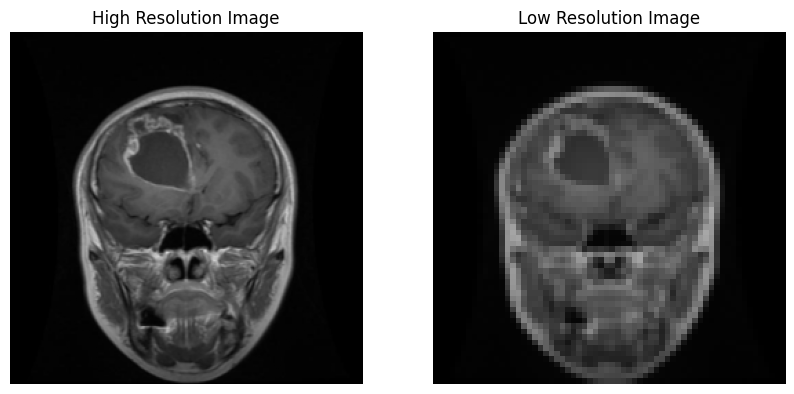

In [13]:
hr_images, lr_images = sample_images(data_train, batch_size = BATCH_SIZE)

fig, ax = plt.subplots(1, 2, figsize = (10, 6))

ax[0].imshow(hr_images[0].permute(1, 2, 0))
ax[0].set_title('High Resolution Image')
ax[0].axis('off')

ax[1].imshow(lr_images[0].permute(1, 2, 0))
ax[1].set_title('Low Resolution Image')
ax[1].axis('off')

## IV. Utility functions

Data Loader, Image Processing

### Data Loader

In [14]:
class CustomData(Dataset):
    def __init__(self, data_df, high_transforms = None, low_transforms = None):
        self.data_df = data_df
        self.lowres_trans = low_transforms
        self.highres_trans = high_transforms
        
    def __len__(self):
        return len(self.data_df)
    
    def __getitem__(self, idx):
        img_path = self.data_df.iloc[idx, 0]
        img = imread(img_path, pilmode = 'RGB', mode = 'F')
        img = img.astype(np.float32)
        
        lowres_img = self.lowres_trans(Image.fromarray(img.astype(np.uint8)))
        highres_img = self.highres_trans(Image.fromarray(img.astype(np.uint8)))
        
        return highres_img, lowres_img

In [15]:
train_data = CustomData(data_df = data_train, high_transforms = high_trans, low_transforms = low_trans)
train_loader = DataLoader(train_data, batch_size = BATCH_SIZE, shuffle = True)

In [16]:
# val_data = CustomData(data_df = data_val, high_transforms = high_trans, low_transforms = low_trans)
# val_loader = DataLoader(val_data, batch_size = BATCH_SIZE, shuffle = True)

In [17]:
test_data = CustomData(data_df = data_test, high_transforms = high_trans, low_transforms = low_trans)
test_loader = DataLoader(test_data, batch_size = BATCH_SIZE, shuffle = True)

HR images shape: torch.Size([4, 3, 256, 256])
LR images shape: torch.Size([4, 3, 64, 64])


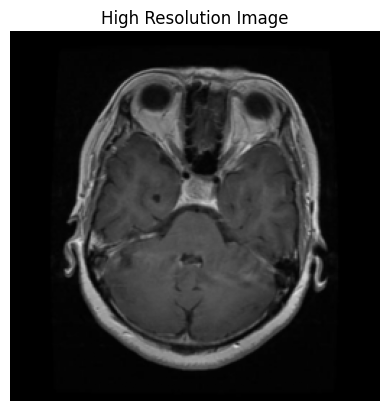

In [18]:
# Test
for hr_images, lr_images in train_loader:
    print(f"HR images shape: {hr_images.shape}")
    print(f"LR images shape: {lr_images.shape}")
    # visualize the first image
    plt.imshow(hr_images[0].permute(1, 2, 0))
    plt.title('High Resolution Image')
    plt.axis('off')
    plt.show()
    break

### A. Metrics

#### 1. PSNR - Peak Signal-to-Noise ratio


PSNR is the ratio between maximum possible power of signal and power of corrupting noise (Wikipedia). 


$${ PSNR = 10  \log_{10}  \left( {MAX_I^2 \over MSE} \right) }$$

$ MAX_I $  -  maximum possible power of a signal of image I  
$ MSE $  -  mean squared error pixel by pixel 

#### 2. SSIM - Structural Similarity Index


SSIM measures the perceptual difference between two similar images [(see Wikipedia)](https://en.wikipedia.org/wiki/Structural_similarity).

$${ SSIM(x, y) = {(2 \mu_x \mu_y + c_1) (2 \sigma_{xy} + c_2) \over (\mu_x^2 + \mu_y^2 + c_1) ( \sigma_x^2 + \sigma_y^2 +c_2)}  }$$


$ \mu_x, \mu_y$       - average value for image $x, y$    
$ \sigma_x, \sigma_y$ - standard deviation for image $x, y$     
$ \sigma_{xy}$        - covariance  of $x$ and $y$      
$ c_1, c_2 $          - coefficients 

Which both will be used below

### IV B. Loss Functions

The most important contribution of the SRGAN paper was the use of a *perceptual loss* function. 


**Perceptual Loss**  is a weighted sum of the *content loss* and *adversarial loss*.


$${ l^{SR} = l_X^{SR} + 10^{-3}l_{Gen}^{SR}}$$

$l^{SR}$ - perceptual loss   
$l_X^{SR}$ - content loss   
$l_{Gen}^{SR}$ - adversarial loss 


****************************

**1. Content Loss**   
The SRGAN replaced the *MSE loss* with a *VGG loss*. Both losses are defined below: 

         
**Pixel-wise MSE loss** is the mean squared error between each pixel in the original HR image and a the corresponding pixel in the generated SR image.


**VGG loss** is the euclidean distance between the feature maps of the generated SR image and the original HR  image. The feature maps are the activation layers of the pre-trained  VGG 19 network. 

$${ l_{{VGG}/{i,j}}^{SR} = {1 \over {W_{i,j}H_{i,j}}} \sum\limits_{x=1}^{W_{i,j}} \sum\limits_{y=1}^{H_{i,j}}  ({\phi}_{i,j}(I^{HR})_{x,y} - {\phi}_{i,j} (G_{{\theta}_G} (I^{LR}))_{x,y})^2}$$


$ l_{{VGG}/{i,j}}^{SR} $  -  VGG loss    
$ {\phi}_{i,j} $  -   the feature map obtained by the j-th convolution (after activation) before the i-th maxpooling layer within the VGG19 network



**2. Adversarial Loss**  
This is calculated based on probabilities provided by Discriminator.

$${ l_{Gen}^{SR} = \sum\limits_{n=1}^{N} - \log{D_{{\theta}_D}} (G_{{\theta}_G} (I^{LR}))}$$

$ l_{Gen}^{SR} $  -  generative loss  
$ D $  -  discriminator function    
$ D_{{\theta}_D} $  -  discriminator function parametrized with $ {\theta}_D $   
$ {D_{{\theta}_D}} (G_{{\theta}_G} (I^{LR})) $   -  probability that the reconstructed image $ 
$ G_{{\theta}_G} (I^{LR}) $  is a natural HR image

### IV C. Saving images

In [40]:
count = 0

In [32]:
def save_images(original_image, lr_image, sr_image):
    """Save LR, HR (original) and generated SR images in one panel"""
    fig, ax = plt.subplots(1, 3, figsize = (10, 6))

    images = [original_image, lr_image, sr_image]
    titles = ['HR', 'LR', 'SR - generated']

    for idx, img in enumerate(images):
        ax[idx].imshow((img + 1) / 2.0, 0, 1)
        ax[idx].axis("off")
    for idx, title in enumerate(titles):    
        ax[idx].set_title('{}'.format(title))

    global count
    count += 1
        
    plt.savefig(r".\\output\\" + f"output_{count}.png")

In [ ]:
# Test save images
for hr_images, lr_images in train_loader:
    save_images(hr_images[0], lr_images[0], lr_images[0])
    break

## V. SRGAN-VGG19

The SRGAN has the following code components:
 1. Generator network
 2. Discriminator network
 3. Adversarial framework

In [20]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, discrim = False, use_act = True, use_bn = True, **kwargs):
        super(ConvBlock, self).__init__()
        
        self.use_act = use_act
        self.conv = nn.Conv2d(in_channels, out_channels, **kwargs, bias = not use_bn)
        self.bn = nn.BatchNorm2d(out_channels) if use_bn else nn.Identity()
        self.act = nn.LeakyReLU(0.2, inplace = True) if discrim else nn.PReLU(num_parameters = out_channels, init = 0.25)
        
    def forward(self, x):
        return self.act(self.bn(self.conv(x))) if self.use_act else self.bn(self.conv(x))

In [21]:
class UpsampleBlock(nn.Module):
    def __init__(self, in_channels, scale):
        super(UpsampleBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, in_channels, kernel_size = 3, padding = 1, stride = 1)
        self.upsample = nn.Upsample(scale_factor = scale, mode = 'bilinear', align_corners = True)
        self.act = nn.PReLU(num_parameters = in_channels)
        
    def forward(self, x):
        return self.act(self.upsample(self.conv(x)))

In [22]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = ConvBlock(in_channels, in_channels, kernel_size = 3, padding = 1, stride = 1)
        self.conv2 = ConvBlock(in_channels, in_channels, kernel_size = 3, padding = 1, stride = 1, use_act = False)
        
    def forward(self, x):
        out = self.conv1(x)
        out = self.conv2(out)
        return out + x

### V 1. Generator

In [23]:
class Generator(nn.Module):
    def __init__(self, in_channels = 3, num_blocks = 16):
        super().__init__()
        self.initial = ConvBlock(in_channels, 64, kernel_size = 9, padding = 4, stride = 1, use_bn = False)
        self.residuals = nn.Sequential(*[ResidualBlock(64) for _ in range(num_blocks)])
        self.convblock = ConvBlock(64, 64, kernel_size = 3, padding = 1, stride = 1, use_act = False)
        self.upsamples = nn.Sequential(UpsampleBlock(64, 2), UpsampleBlock(64, 2))
        self.final = nn.Conv2d(64, in_channels, kernel_size = 9, padding = 4, stride = 1)
        
    def forward(self, x):
        x = self.initial(x)
        residual = self.residuals(x)
        out = self.convblock(residual) + x
        out = self.upsamples(out)
        return torch.tanh(self.final(out))

There are 16 residual blocks and 2 upsampling blocks. The generator follows the architecture outlined in [2]. 

### V 2. Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_channels = 3, features = [64, 64, 128, 128, 256, 256, 512, 512]):
        super().__init__()
        blocks = []
        for idx, feature in enumerate(features):
            blocks.append(ConvBlock(in_channels, feature, kernel_size = 3, padding = 1, stride = 1 + (idx) % 2, discrim = True, use_bn = True))
            in_channels = feature
        self.model = nn.Sequential(*blocks)
        self.final = nn.Sequential(
            nn.AdaptiveAvgPool2d((6, 6)),
            nn.Flatten(),
            nn.Linear(512 * 6 * 6, 1024),
            nn.LeakyReLU(0.2, inplace = True),
            nn.Linear(1024, 1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        x = self.model(x)
        return self.final(x)    

In [26]:
def test():
    low_resolution = 64 
    with torch.cuda.amp.autocast():
        x = torch.randn((5, 3, low_resolution, low_resolution))
        gen = Generator()
        gen_out = gen(x)
        disc = Discriminator()
        disc_out = disc(gen_out)

        print(gen_out.shape)
        print(disc_out.shape)
        
test()

torch.Size([5, 3, 256, 256])
torch.Size([5, 1])


## VI. Training 


In [33]:
class SRGAN(l.LightningModule):
    def __init__(self):
        super().__init__()
        # Metrics
        self.psnr = PSNR(data_range = 1.0, device = device)
        self.ssim = SSIM(data_range = 1.0, kernel_size = (11, 11), sigma = 1.5, k1 = 0.01, k2 = 0.03, device = device)
        
        # Example input
        self.example_input_array = torch.Tensor(16, 3, 64, 64).to(device)
        
        # Model define
        self.generator = Generator(in_channels = 3, num_blocks = 16)
        self.discriminator = Discriminator()
        self.vgg_net = models.vgg19(pretrained = True).features[:35].eval()
        
        # Custom optimizer settings
        self.automatic_optimization = False
        
        
    def forward(self, x):
        """Forward pass for demo purposes"""
        return self.generator(x), self.discriminator(x), self.vgg_net(torch.Tensor(16, 3, 256, 256).to(device))
        
        
    def configure_optimizers(self):
        """Automatic optimizer configuration."""
        gen_optimizer = torch.optim.Adam(self.generator.parameters(), lr = 1e-4, betas = (0.9, 0.999))
        disc_optimizer = torch.optim.Adam(self.discriminator.parameters(), lr = 1e-4, betas = (0.9, 0.999))
        return [gen_optimizer, disc_optimizer]

    def training_step(self, train_batch, batch_idx):
        """Training phase"""
        hr, lr = train_batch
        
        # Discriminator training
        self.optimizers()[1].zero_grad()
        super_resolution_gen = self.generator(lr).detach()
        
        # Real and Fake outputs
        real_output = self.discriminator(hr)
        fake_output = self.discriminator(super_resolution_gen)
        
        # Discriminator losses
        real_loss = F.binary_cross_entropy_with_logits(real_output, torch.ones_like(real_output))
        fake_loss = F.binary_cross_entropy_with_logits(fake_output, torch.zeros_like(fake_output))
        discriminator_loss = real_loss + fake_loss
        
        # Discriminator update
        discriminator_loss.backward()
        self.optimizers()[1].step()
        
        self.log("Discriminator Loss", discriminator_loss, on_step = True, prog_bar = True, logger = True)
    
        # Generator training
        self.optimizers()[0].zero_grad()
        super_resolution_gen = self.generator(lr)
        
        # Generator adversarial loss
        adversarial_loss = F.binary_cross_entropy_with_logits(self.discriminator(super_resolution_gen), torch.ones_like(self.discriminator(super_resolution_gen)))
        
        # Content loss
        gen_feature = self.vgg_net(super_resolution_gen)
        hr_feature = self.vgg_net(hr)
        content_loss = F.mse_loss(gen_feature, hr_feature)
        
        # Total generator loss
        generator_loss = content_loss + 1e-3 * adversarial_loss
        
        # Generator update
        generator_loss.backward()
        self.optimizers()[0].step()
        
        self.log("Generator Loss", generator_loss, on_step = True, prog_bar = True, logger = True)
        
        if batch_idx % 100 == 0:
            save_images(hr[0].cpu().detach().numpy(), lr[0].cpu().detach().numpy(), super_resolution_gen[0].cpu().detach().numpy())
        
    def test_step(self, test_batch, batch_idx):
        """Test phase"""
        hr, lr = test_batch
        with torch.cuda.amp.autocast():
            super_resolution_gen = self.generator(lr)
            self.psnr.update((super_resolution_gen, hr.type(torch.float16)))
            self.ssim.update((super_resolution_gen, hr.type(torch.float16)))
            
    def on_test_epoch_end(self):
        psnr = self.psnr.compute()
        ssim = self.ssim.compute()
        self.log_dict({"PSNR": psnr, "SSIM": ssim})

In [ ]:
model = SRGAN().to(device)
trainer = Trainer(enable_model_summary = False,
                  profiler = "simple",
                  accelerator = "auto",
                  devices = "auto",
                  strategy = "auto",
                  max_epochs = EPOCHS)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [29]:
summary = ModelSummary(model)
print(summary)

  | Name          | Type          | Params | Mode  | In sizes          | Out sizes        
------------------------------------------------------------------------------------------------
0 | generator     | Generator     | 1.3 M  | train | [16, 3, 64, 64]   | [16, 3, 256, 256]
1 | discriminator | Discriminator | 23.6 M | train | [16, 3, 64, 64]   | [16, 1]          
2 | vgg_net       | Sequential    | 20.0 M | eval  | [16, 3, 256, 256] | [16, 512, 16, 16]
------------------------------------------------------------------------------------------------
44.9 M    Trainable params
0         Non-trainable params
44.9 M    Total params
179.664   Total estimated model params size (MB)
205       Modules in train mode
36        Modules in eval mode


In [ ]:
save_path = ".\\lightning_logs\\SRGAN\\checkpoints\\epoch=99-step=71400.ckpt"

In [ ]:
model = SRGAN.load_from_checkpoint(save_path)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 6:  70%|██████▉   | 996/1428 [10:38<04:36,  1.56it/s, v_num=25, Discriminator Loss=1.010, Generator Loss=0.369] 


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

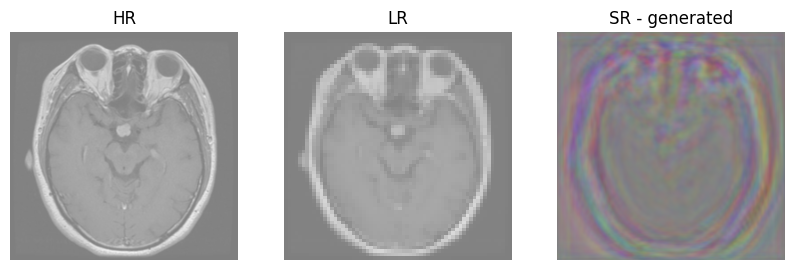

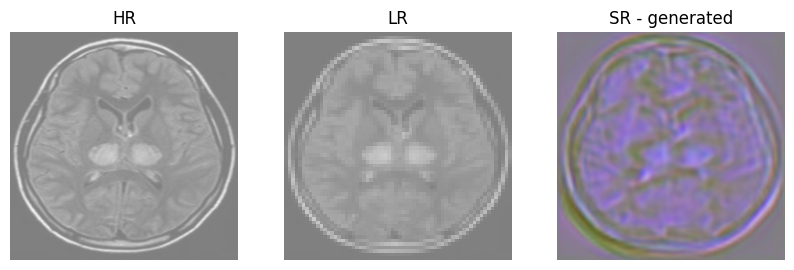

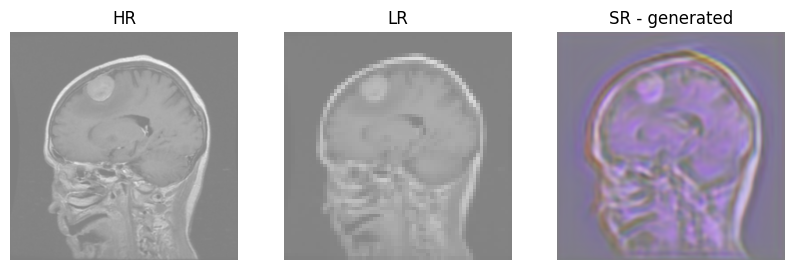

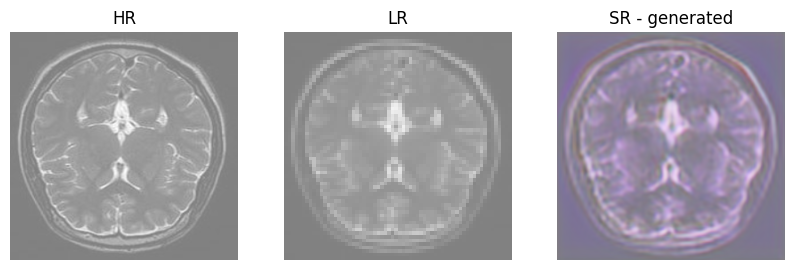

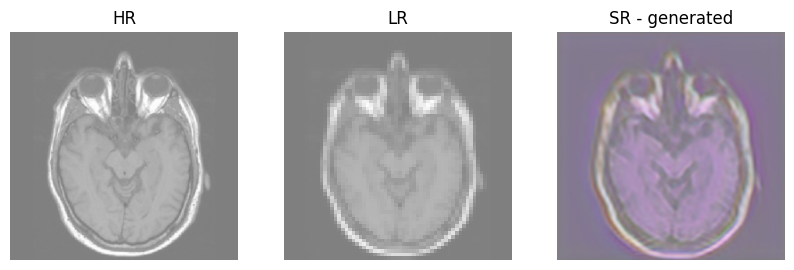

...

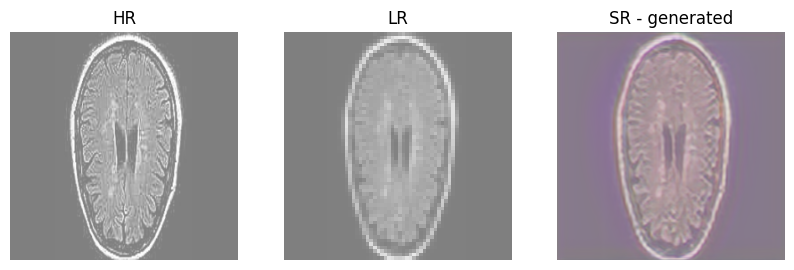

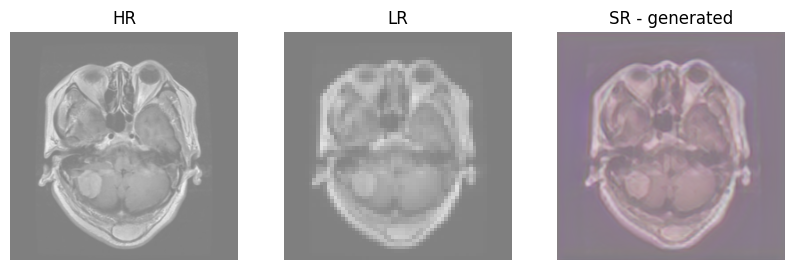

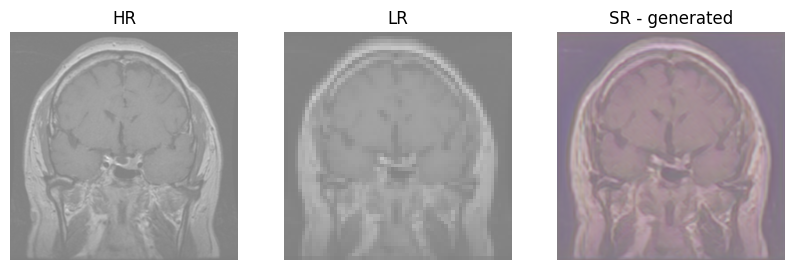

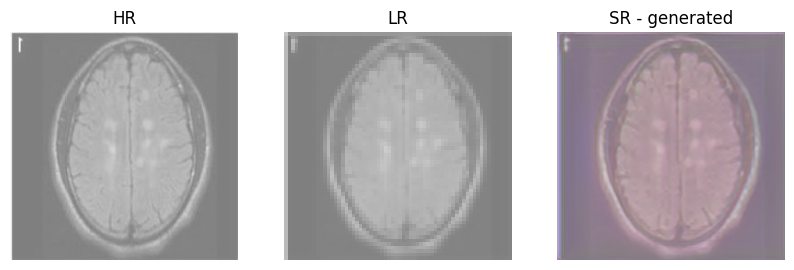

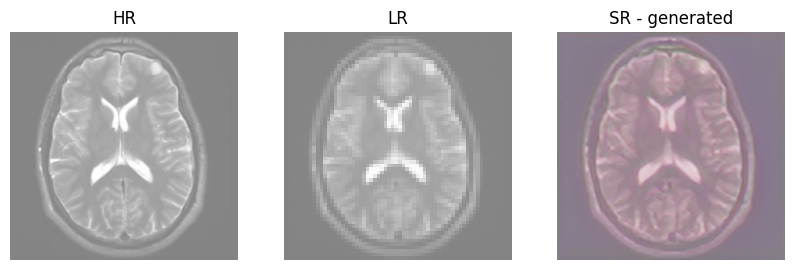

In [35]:
trainer.fit(model, train_loader)

In [ ]:
trainer.test(model, test_loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████| 82/82 [00:28<00:00,  2.83it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           PSNR            │    -0.3460581302642822    │
│           SSIM            │    0.05565864220261574    │
└───────────────────────────┴───────────────────────────┘

TEST Profiler Report

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                        	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                                                                                                                         	|  -              	|  787428         	

[{'PSNR': -0.3460581302642822, 'SSIM': 0.05565864220261574}]

In [19]:
class SRResNet(l.LightningModule):
    def __init__(self, in_channels = 3, num_blocks = 16):
        super(SRResNet, self).__init__()
        self.psnr = PSNR(data_range = 1.0, device = device)
        self.ssim = SSIM(data_range = 1.0, kernel_size = (11, 11), sigma = 1.5, k1 = 0.01, k2 = 0.03, device = device)
        
        # Example input
        self.example_input_array = torch.Tensor(1, in_channels, 64, 64)
        
        # Model definition
        self.generator = Generator(in_channels = in_channels, num_blocks = num_blocks)
        
    def forward(self, x):
        """Forward pass"""
        return self.generator(x)
        
    def configure_optimizers(self):
        """Configure optimizer"""
        optimizer = torch.optim.Adam(self.generator.parameters(), lr = 1e-4, betas = (0.9, 0.999))
        return optimizer
        
    def training_step(self, train_batch, batch_idx):
        """Training phase"""
        hr, lr = train_batch
        sr = self.generator(lr)
        loss = F.mse_loss(sr, hr)
        self.log("train_loss", loss, on_step = True, prog_bar = True, logger = True)
        return loss
        
    def test_step(self, test_batch, batch_idx):
        """Test phase"""
        hr, lr = test_batch
        with torch.cuda.amp.autocast():
            super_resolution_gen = self.generator(lr)
            self.psnr.update((super_resolution_gen, hr.type(torch.float16)))
            self.ssim.update((super_resolution_gen, hr.type(torch.float16)))
            
    def on_test_epoch_end(self):
        psnr = self.psnr.compute()
        ssim = self.ssim.compute()
        self.log_dict({"PSNR": psnr, "SSIM": ssim})

In [25]:
model_2 = SRResNet().to(device)

In [26]:
summary = ModelSummary(model_2)
print(summary)

  | Name      | Type      | Params | Mode  | In sizes       | Out sizes       
------------------------------------------------------------------------------------
0 | generator | Generator | 1.3 M  | train | [1, 3, 64, 64] | [1, 3, 256, 256]
------------------------------------------------------------------------------------
1.3 M     Trainable params
0         Non-trainable params
1.3 M     Total params
5.312     Total estimated model params size (MB)
164       Modules in train mode
0         Modules in eval mode


In [27]:
save_path = ".\\lightning_logs\\SRResNet\\checkpoints\\epoch=99-step=142800.ckpt"

In [28]:
model_2 = SRResNet.load_from_checkpoint(save_path)

In [29]:
trainer_2 = Trainer(enable_model_summary = False,
                    profiler = "simple",
                    accelerator = "auto",
                    devices = "auto" ,
                    strategy = "auto",
                    max_epochs = EPOCHS)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [51]:
trainer_2.fit(model_2, train_loader, test_loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 99: 100%|██████████| 1428/1428 [03:34<00:00,  6.65it/s, v_num=27, train_loss=0.000533]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 99: 100%|██████████| 1428/1428 [03:34<00:00,  6.65it/s, v_num=27, train_loss=0.000533]


FIT Profiler Report

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                        	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                                                                                                                         	|  -              	|  4285022        	|

In [30]:
trainer_2.test(model_2, test_loader)

You are using a CUDA device ('NVIDIA GeForce RTX 3050 Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████| 328/328 [00:44<00:00,  7.39it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           PSNR            │     32.08135986328125     │
│           SSIM            │    0.9594085216522217     │
└───────────────────────────┴───────────────────────────┘

TEST Profiler Report

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Action                                                                                                                                                   	|  Mean duration (s)	|  Num calls      	|  Total time (s) 	|  Percentage %   	|
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|  Total                                                                                                                                                    	|  -              	|  3958           	|  59.937         	|  100 

[{'PSNR': 32.08135986328125, 'SSIM': 0.9594085216522217}]

TypeError: 'norm' must be an instance of matplotlib.colors.Normalize, str or None, not a int

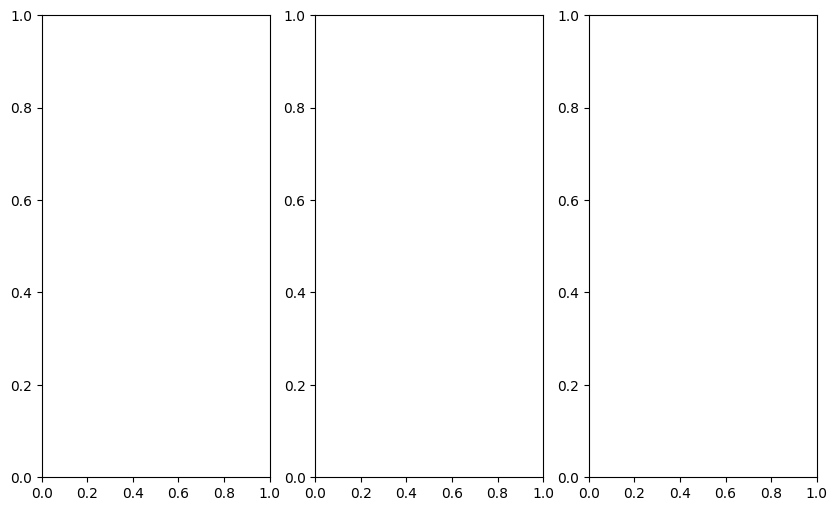

In [33]:
# Test on random image
def test_image(model):
    hr, lr = sample_images(data_test, batch_size = 1)
    with torch.no_grad():
        sr = model(lr)
    save_images(hr[0].cpu().detach().numpy(), lr[0].cpu().detach().numpy(), sr[0].cpu().detach().numpy())

test_image(model_2)

## VII. References and further reading


<a name="ref1"></a>[1] [Goodfellow et al. 'Generative Adversarial Nets'](https://arxiv.org/pdf/1406.2661.pdf)

<a name="ref2"></a>[2] [Ledig et al. 'Photo-Realistic Single Image Super-Resolution Using a Generative Adversarial Network'](https://arxiv.org/abs/1609.04802)

<a name="ref3"></a>[3] [Kailash Ahirwar. 'Generative Adversarial Networks Projects'](https://github.com/PacktPublishing/Generative-Adversarial-Networks-Projects)

<a name="ref4"></a>[4] [Saeed Anwar et al. 'A Deep Journey into Super-resolution: A Survey'](https://arxiv.org/pdf/1904.07523.pdf)

<a name="ref5"></a>[5] [Xintao Wang et al. 'ESRGAN: Enhanced Super-Resolution Generative Adversarial Networks'](https://arxiv.org/pdf/1809.00219.pdf)